## Installation of the libraries used.

In [1]:
!pip install geopandas
!pip install folium==0.11

## Import libraries

In [2]:
import folium
folium.__version__

'0.11.0'

In [3]:
import pandas as pd
from pathlib import Path
from matplotlib.patches import Patch
import matplotlib
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, LineString
import matplotlib.pyplot as plt
import folium
from folium.plugins import MeasureControl,Draw,MousePosition, Search,FloatImage, MarkerCluster, HeatMap, DualMap, TimestampedGeoJson
from folium import FeatureGroup,LayerControl
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup
import branca
import seaborn as sns
from matplotlib.ticker import StrMethodFormatter
from datetime import datetime, timedelta
matplotlib.rc_file_defaults()
import os

folder_img = Path('images')
# folder_html = Path(r"C:\Users\Camilo\Proyectos\camilogutierrez.github.io")

In [4]:
os.getcwd()

'C:\\Users\\Camilo\\Proyectos\\DS4A\\project_ISA\\Team4_Project_Week_7\\mintic'

### Matplotlib Customizations



In [5]:
SMALL_SIZE = 13
MEDIUM_SIZE = 13
BIGGER_SIZE = 15


# https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rc('figure', figsize=[6,3])    # Cambiar el tamaño por defecto Widht,Height
#plt.rcParams["font.family"] = "Times New Roman"
#plt.rcParams["font.family"] = "sans-serif"
#plt.rc('font',**{'family':'serif','serif':['Times']}) #Latex
#plt.rc('text', usetex=True) #Latex
matplotlib.rcParams['mathtext.default']='rm' # Lates sin cursiva

matplotlib.rcParams['axes.edgecolor'] = '0.6'
matplotlib.rcParams['axes.labelcolor'] = '0.1'
matplotlib.rcParams['axes.linewidth'] = '0.65'
matplotlib.rcParams['text.color'] = '.13'
matplotlib.rcParams['xtick.color'] = '.15'
matplotlib.rcParams['xtick.direction'] = 'out' # ticks in or out
matplotlib.rcParams['ytick.color'] = '.15'
matplotlib.rcParams['xtick.major.size'] = "2"     ## major tick size in points
matplotlib.rcParams['ytick.major.size'] = "2"     ## major tick size in points
matplotlib.rcParams['xtick.major.width'] = "0.8"     ## major tick width in points
matplotlib.rcParams['xtick.major.pad'] = "2.5"  ## distance to major tick label in points
matplotlib.rcParams['ytick.major.pad'] = "2.5"  ## distance to major tick label in points
#xtick.minor.size    : 2       ## minor tick size in points
#xtick.major.width   : 0.8     ## major tick width in points
#xtick.minor.width   : 0.6     ## minor tick width in points
#xtick.major.pad     : 3.5     ## distance to major tick label in points
#xtick.minor.pad     : 3.4     ## distance to the minor tick label in points
#matplotlib.rcParams['xtick.minor.visible'] = False   ## visibility of minor ticks on x-axis
matplotlib.rcParams['xtick.minor.size'] = 0  

matplotlib.rcParams['axes.grid'] = True   ## display grid or not
matplotlib.rcParams["grid.linestyle"] = '--'
matplotlib.rcParams["grid.linewidth"] = 0.4
matplotlib.rcParams["grid.alpha"] = 0.6

matplotlib.rcParams['ytick.direction'] = 'out'
matplotlib.rcParams['axes.spines.top'] = True
matplotlib.rcParams['axes.spines.right'] = True
# register_matplotlib_converters()
matplotlib.rcParams['savefig.bbox']='tight'    ## {tight, standard}

In [6]:
def style_df(df1, copy = False, **kwargs):
    '''Upper case dataframes and removes the accents in the words
    '''
    df = df1.copy()
    df.rename(columns = lambda x:x.upper(), inplace = True)
    remove_col = kwargs.get('remove_col')
    cols = df.select_dtypes(include=[np.object]).columns
    cols = np.setdiff1d(cols, remove_col)    
    df.loc[:,cols] = df.loc[:,cols].apply(lambda x:x.str.upper())
    df.loc[:,cols] = df.loc[:,cols].apply(lambda x:x.str.replace('ñ','$$$', regex =False), )
    df.loc[:,cols] = df.loc[:,cols].apply(lambda x: x.str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8'))
    df.loc[:,cols] = df.loc[:,cols].apply(lambda x:x.str.replace('$$$',  'Ñ', regex =False), ) #Para que no quite la ñ
    df.rename(columns={'GEOMETRY':'geometry'}, inplace=True)
    return df


### File reading


In [7]:
discharges = pd.read_csv('data/discharges.csv', header=0, delimiter=',', index_col=0,
                         names=['date','longitude','latitude','polarity','magnitude','current'], parse_dates=['date'])
discharges_gdf = gpd.GeoDataFrame(discharges, geometry=gpd.points_from_xy(discharges.longitude, discharges.latitude))
# df_fallas
outages = pd.read_csv('data/outages.csv', header=0, delimiter=',', index_col=0,
                     names=['date','year','time','cause','outages_number','r_inf','r_sup'], parse_dates=['date'])

In [8]:
towers = pd.read_csv('data/towers.csv', header=0, delimiter=',', names=['longitude','latitude'])
towers = gpd.GeoDataFrame(towers, geometry=gpd.points_from_xy(towers.longitude, towers.latitude))
gdf_json = towers.to_json()

In [9]:
stations_IDEAM = gpd.GeoDataFrame.from_file(r"data/CNE_IDEAM/CNE_IDEAM.shp")

In [10]:
radio = LineString(towers['geometry']).centroid.buffer(1)
radio_gdf= gpd.GeoDataFrame(geometry=[radio]).to_json()
estaciones_filter = stations_IDEAM.loc[stations_IDEAM.within(radio)].copy()
estaciones_filter = style_df(estaciones_filter)

In [11]:
pd.options.display.float_format = "{:.2f}".format
# discharges.describe(include='all')

##Basic Stats of DF

In [12]:
# Statistics Summary of discharges data frame
discharges.describe()

,longitude,latitude,polarity,magnitude,current
count,252062.00,252062.00,252062.00,252062.00,252062.00
mean,-74.00,6.74,-0.41,14.31,-9.01
std,0.20,0.25,0.91,14.25,18.07
min,-74.35,6.35,-1.00,1.80,-316.70
25%,-74.17,6.52,-1.00,6.40,-15.20
50%,-74.00,6.72,-1.00,9.30,-7.70
75%,-73.84,6.97,1.00,16.70,4.90
max,-73.63,7.17,1.00,316.70,156.70


In [13]:
discharges.corr()

,longitude,latitude,polarity,magnitude,current
longitude,1.00,-0.03,-0.04,0.07,-0.06
latitude,-0.03,1.00,-0.00,0.03,-0.02
polarity,-0.04,-0.00,1.00,-0.24,0.64
magnitude,0.07,0.03,-0.24,1.00,-0.79
current,-0.06,-0.02,0.64,-0.79,1.00


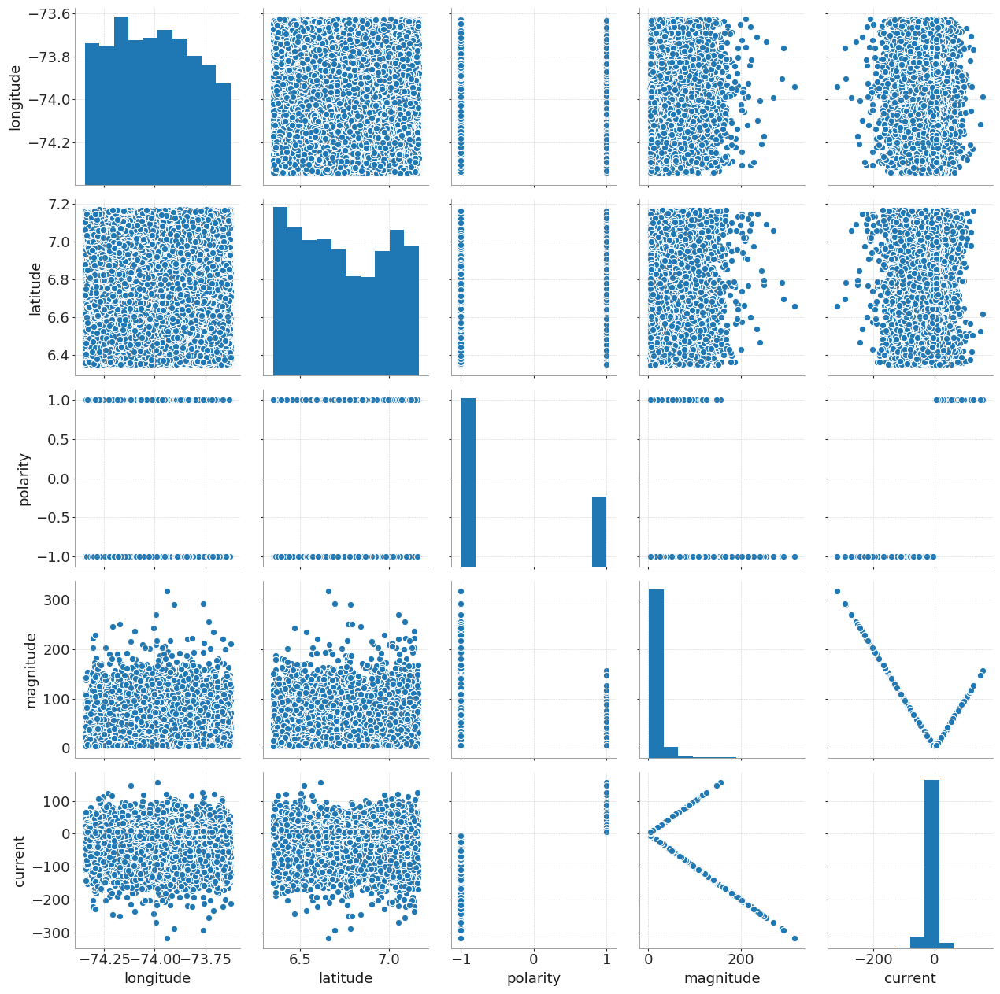

In [14]:
# dataframe
# Basic correlogram
sns.pairplot(discharges)

In [15]:
# Statistics Summary of outages data frame
outages.describe()

,year,outages_number,r_inf,r_sup
count,12.00,12.00,12.00,12.00
mean,2018.42,1.00,49.17,54.17
std,0.51,0.00,28.35,28.35
min,2018.00,1.00,0.00,5.00
25%,2018.00,1.00,41.25,46.25
50%,2018.00,1.00,47.50,52.50
75%,2019.00,1.00,65.00,70.00
max,2019.00,1.00,90.00,95.00


In [16]:
# Statistics Summary of towers data frame
towers.describe()

,longitude,latitude
count,242.00,242.00
mean,-73.93,6.73
std,0.16,0.19
min,-74.35,6.45
25%,-74.06,6.55
50%,-73.88,6.72
75%,-73.78,6.89
max,-73.75,7.07


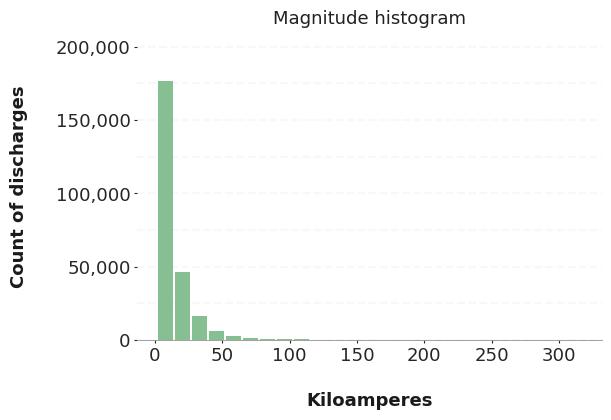

In [17]:
ax = discharges.hist(column='magnitude', bins=25, grid=False, figsize=(6,4), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Magnitude histogram")

    # Set x-axis label
    x.set_xlabel("Kiloamperes", labelpad=20, weight='bold')

    # Set y-axis label
    x.set_ylabel("Count of discharges", labelpad=20, weight='bold')

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

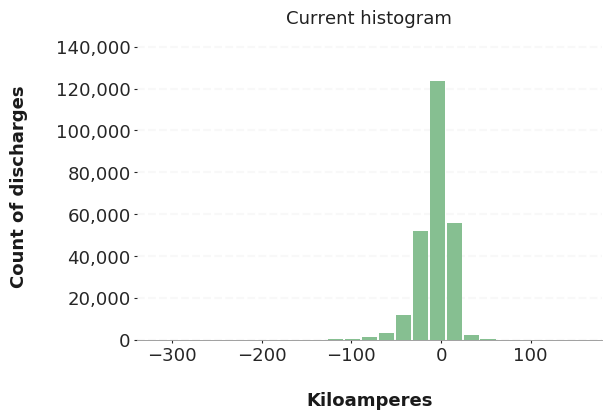

In [18]:
ax = discharges.hist(column='current', bins=25, grid=False, figsize=(6,4), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Current histogram")

    # Set x-axis label
    x.set_xlabel("Kiloamperes", labelpad=20, weight='bold')

    # Set y-axis label
    x.set_ylabel("Count of discharges", labelpad=20, weight='bold')

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

In [19]:
#Relaciona las decargas a la salida de operación de la linea.
i = 0
discharges_between_outage = pd.DataFrame()
outage_Line = outages.index[i]
datetime_i = discharges['date'].min()
datetime_f = outages.iloc[i]['date']
for x in enumerate(outages['date']):    
    df_aux = pd.DataFrame(discharges[(discharges['date']>datetime_i) & (discharges['date']<datetime_f)])
    df_aux['outage_line'] = outage_Line
    discharges_between_outage = discharges_between_outage.append(df_aux)
    if i+1 < (outages['date']).count():
        outage_Line = outages.index[i+1]
        datetime_i = outages.iloc[i]['date']
        datetime_f = outages.iloc[i+1]['date']
        i = i + 1
    else: i = 0

In [20]:
discharges_between_outage.head()

,date,longitude,latitude,polarity,magnitude,current,geometry,outage_line
1,2018-04-01 00:01:37.247,-73.74,6.51,1,12.10,12.10,POINT (-73.74390 6.50950),57
2,2018-04-01 00:01:37.263,-73.76,6.51,-1,12.30,-12.30,POINT (-73.75950 6.51070),57
3,2018-04-01 00:02:17.110,-73.98,6.68,-1,12.70,-12.70,POINT (-73.98320 6.68100),57
4,2018-04-01 00:03:11.770,-73.68,6.53,1,5.10,5.10,POINT (-73.68360 6.53480),57
5,2018-04-01 00:03:12.260,-73.68,6.53,1,5.90,5.90,POINT (-73.68430 6.53380),57


## Exploratory analysis

(array([736815., 736876., 736938., 736999., 737060., 737119., 737180.,
        737241., 737303., 737364.]),
 <a list of 10 Text xticklabel objects>)

C:\Users\Camilo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


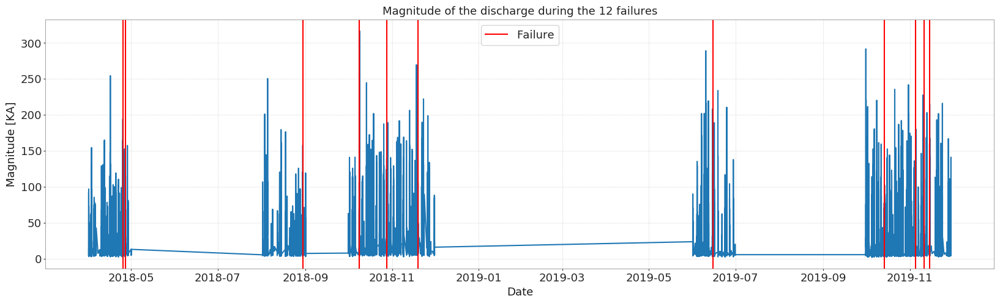

In [21]:
fig,ax = plt.subplots(figsize=(20,6))
discharges.plot(x='date',y='magnitude', ax=ax, Label=False)

outage_dates = list(outages['date'])
for xc in outage_dates:
    ax.axvline(x=xc, color='red', linestyle='-', label='Failure')
handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[1]],[labels[1]])
ax.tick_params(rotation=0, )
ax.set_ylabel('Magnitude [KA]')
ax.set_xlabel('Date')
ax.set_title('Magnitude of the discharge during the 12 failures')
plt.xticks(ha='center')

(array([736815., 736876., 736938., 736999., 737060., 737119., 737180.,
        737241., 737303., 737364.]),
 <a list of 10 Text xticklabel objects>)

C:\Users\Camilo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


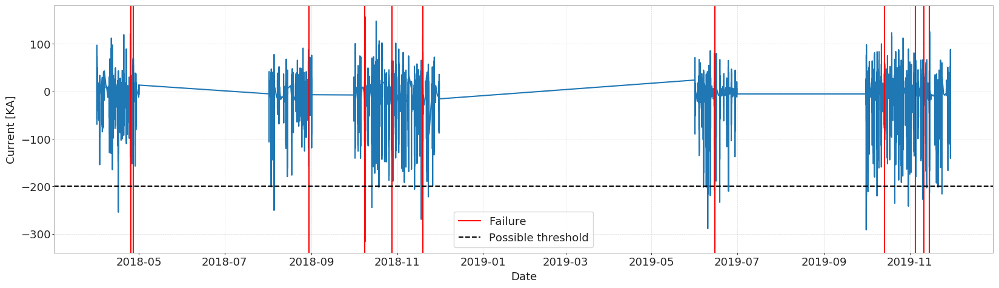

In [22]:
fig,ax = plt.subplots(figsize=(20,6))
discharges.plot(x='date',y='current', ax=ax, Label=False)

outage_dates = list(outages['date'])
for xc in outage_dates:
    ax.axvline(x=xc, color='red', linestyle='-', label='Failure')
ax.tick_params(rotation=0, )
ax.set_ylabel('Current [KA]')
ax.set_xlabel('Date')
# ax.set_title('F')
ax.axhline(-200, ls='--', c='k', label='Possible threshold')
handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[1],handles[-1]],[labels[1],labels[-1]])
plt.xticks(ha='center')

(array([736815., 736876., 736938., 736999., 737060., 737119., 737180.,
        737241., 737303., 737364.]),
 <a list of 10 Text xticklabel objects>)

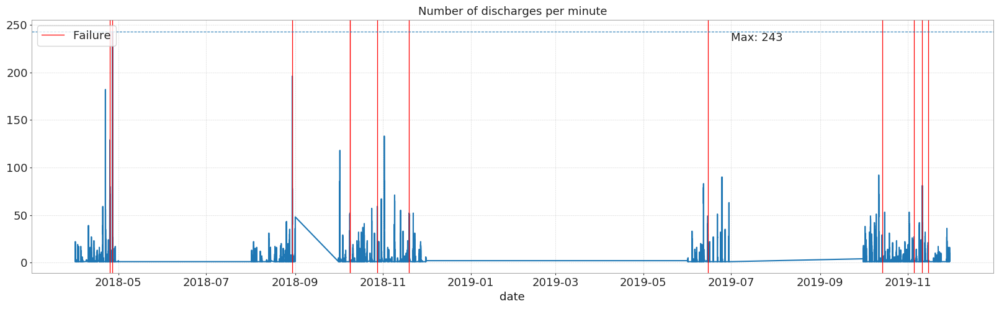

In [23]:
# Discharges per minute
discharges_ = discharges.copy()
discharges_['count'] = 1
discharges_per_minute = discharges_.groupby(pd.Grouper(key='date', freq='min'))['count'].value_counts()
discharges_per_minute = discharges_per_minute.reset_index(level=1, drop=True)
fig,ax = plt.subplots(figsize=(20,6))
discharges_per_minute.plot(kind='line',ax=ax)
ax.set_title('Number of discharges per minute')
ax.annotate(xy=('2019-07',242),s='Max: {}'.format(discharges_per_minute.max()), va='top')

outage_dates = list(outages['date'])
for xc in outage_dates:
    ax.axvline(x=xc, color='red',lw=0.9, linestyle='-', label='Failure')
handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[1]],[labels[1]], loc='upper left')
ax.axhline(243, lw=0.8,ls='--')
plt.xticks(rotation=0,ha='center')

In [24]:
outages.groupby(outages['date'].dt.strftime('%b')).count()['time'][['Apr','Jun', 'Aug', 'Oct',  'Nov',]]

date
Apr    2
Jun    1
Aug    1
Oct    4
Nov    4
Name: time, dtype: int64

Text(0.5, 0.98, 'Monthly variation')

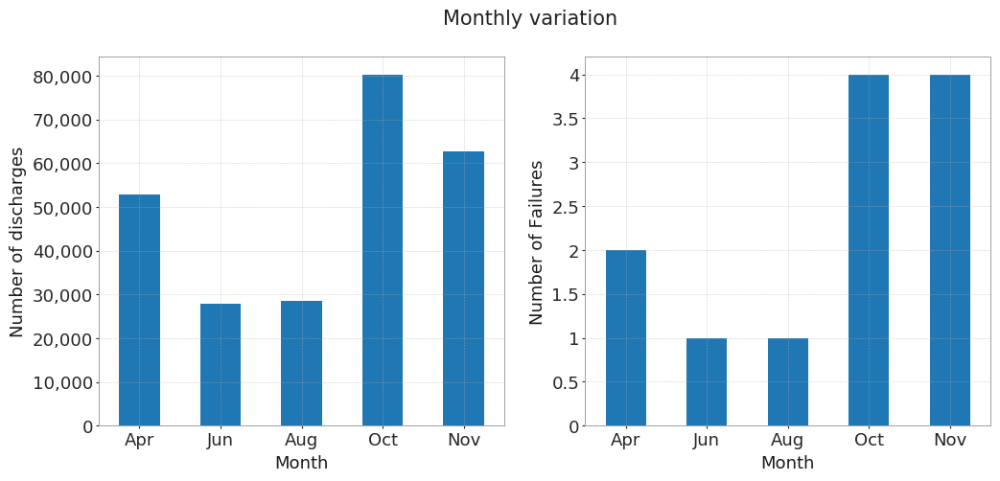

In [25]:
fig,(ax,ax1) = plt.subplots(1,2,figsize=(12,5))
discharges.groupby(discharges['date'].dt.strftime('%b')).count()['magnitude'][['Apr','Jun', 'Aug', 'Oct',  'Nov',]].plot.bar(ax=ax)
ax.tick_params(rotation=0)
ax.set_ylabel('Number of discharges')
ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

outages.groupby(outages['date'].dt.strftime('%b')).count()['time'][['Apr','Jun', 'Aug', 'Oct',  'Nov',]].plot.bar(ax=ax1)
ax1.tick_params(rotation=0)
ax1.set_ylabel('Number of Failures')
ax1.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))
[ax.set_xlabel('Month') for ax in [ax, ax1]]
fig.suptitle('Monthly variation')

Text(0.5, 0.98, 'Hourly variation')

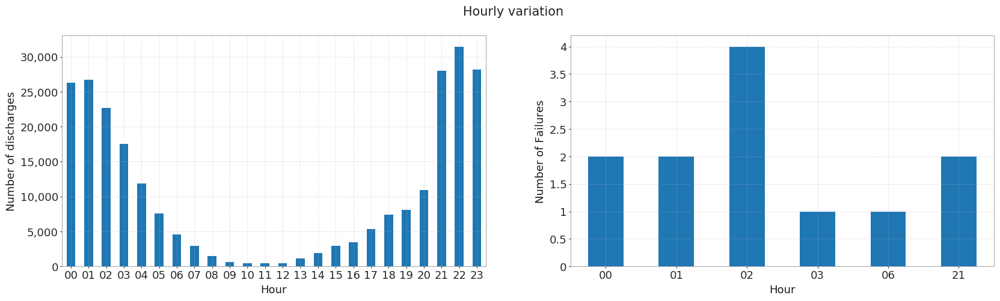

In [26]:
fig,(ax,ax1) = plt.subplots(1,2,figsize=(20,5))

discharges.groupby(discharges['date'].dt.strftime('%H')).count()['magnitude'].plot.bar(ax=ax)
ax.tick_params(rotation=0)
ax.set_ylabel('Number of discharges')
ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

outages.groupby(outages['date'].dt.strftime('%H')).count()['time'].plot.bar(ax=ax1)
ax1.tick_params(rotation=0)
ax1.set_ylabel('Number of Failures')
ax1.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

[ax.set_xlabel('Hour') for ax in [ax, ax1]]

fig.suptitle('Hourly variation')

In [27]:
style_df(estaciones_filter)

,OBJECTID,CODIGO,NOMBRE,CATEGORIA,TECNOLOGIA,ESTADO,FECHA_INST,ALTITUD,LATITUD,LONGITUD,DEPARTAMEN,MUNICIPIO,AREA_OPERA,AREA_HIDRO,ZONA_HIDRO,ENTIDAD,CORRIENTE,FECHA_SUSP,SUBZONA_HI,geometry
2298,389.00,23125060,ALBANIA [23125060],CLIMATICA ORDINARIA,CONVENCIONAL,ACTIVA,1974-03-15,1690.00,5.76,-73.91,SANTANDER,ALBANIA (SANTANDER),AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,CANAL PRINCIPAL,None,RAO CARARE (MINERO),POINT (-73.91333 5.75833)
2313,409.00,23120100,ALBANIA [23120100],PLUVIOMATRICA,CONVENCIONAL,SUSPENDIDA,1959-11-15,1925.00,5.78,-73.92,SANTANDER,ALBANIA (SANTANDER),AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,CHICAMOCHA,1974-02-15,RAO CARARE (MINERO),POINT (-73.91667 5.78333)
2326,4246.00,2401500052,PUENTE GUILLERMO - AUT [2401500052],CLIMATICA PRINCIPAL,AUTOMATICA CON TELEMETRAA,ACTIVA,2017-10-31,2246.00,5.80,-73.73,SANTANDER,PUENTE NACIONAL,AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,SOGAMOSO,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,0,None,RAO SUAREZ,POINT (-73.72667 5.79642)
2365,1002.00,23120220,PRADERA LA [23120220],PLUVIOMATRICA,CONVENCIONAL,ACTIVA,1980-08-15,2590.00,5.87,-73.91,SANTANDER,JESAOS MARAA,AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,SURBA,None,RAO CARARE (MINERO),POINT (-73.91333 5.87083)
2366,4145.00,24017590,PUENTE NACIONAL - AUT [24017590],LIMNIGRAFICA,AUTOMATICA CON TELEMETRAA,ACTIVA,1974-02-14,1650.00,5.87,-73.68,SANTANDER,PUENTE NACIONAL,AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,SOGAMOSO,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,SUAREZ,None,RAO SUAREZ,POINT (-73.67778 5.87278)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3125,436.00,23200060,SANTO DOMINGO [23200060],PLUVIOMATRICA,CONVENCIONAL,ACTIVA,1974-08-15,80.00,7.67,-73.94,BOLAVAR,SAN PABLO (BOLAVAR),AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,LEBRIJA,None,DIRECTOS AL MAGDALENA (BRAZO MORALES),POINT (-73.94194 7.67056)
3133,4250.00,2319700096,SAN JUAN DE LOS CHORROS - AUT [2319700096],LIMNIGRAFICA,AUTOMATICA CON TELEMETRAA,ACTIVA,2017-12-31,55.00,7.69,-73.77,SANTANDER,PUERTO WILCHES,AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,LEBRIJA,None,RAO LEBRIJA Y OTROS DIRECTOS AL MAGDALENA,POINT (-73.77406 7.69281)
3138,443.00,23187190,EDEN EL [23187190],LIMNIMATRICA,CONVENCIONAL,SUSPENDIDA,1979-04-15,61.00,7.70,-73.83,BOLAVAR,SAN PABLO (BOLAVAR),AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,MAGDALENA,1979-05-15,DIRECTOS AL MAGDALENA (BRAZO MORALES),POINT (-73.83333 7.70000)
3139,444.00,23187200,FE LA [23187200],LIMNIMATRICA,CONVENCIONAL,SUSPENDIDA,1979-05-15,77.00,7.70,-73.82,SANTANDER,PUERTO WILCHES,AREA OPERATIVA 08 - SANTANDERES-ARAUCA,MAGDALENA CAUCA,MEDIO MAGDALENA,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,MAGDALENA,1979-09-15,RAO LEBRIJA Y OTROS DIRECTOS AL MAGDALENA,POINT (-73.81667 7.70000)


### Location of the line, heatmap of the discharges and IDEAM stations of discharge and climatology





In [28]:
lat_centro=LineString(towers['geometry']).centroid.y
long_centro=LineString(towers['geometry']).centroid.x

m = folium.Map(location=[lat_centro,long_centro],
               zoom_start=9,
               control_scale=True)

folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Street_Map/MapServer/tile/{z}/{y}/{x}.jpg', 
                 overlay=True,attr='World_Imagery',name='World Street Map - Arcgis',show=False).add_to(m)
folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}.jpg', 
                 overlay=True,attr='World_Imagery',name='Satelital - ESRI',show=False).add_to(m)
folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/World_Shaded_Relief/MapServer/tile/{z}/{y}/{x}.jpg', 
                 overlay=True,attr='World_Imagery',name='Shaded Relief',show=False).add_to(m)

# folium.GeoJson(gdf_json,name='Torres de la línea Comuneros – Primavera').add_to(m)
layer2 = folium.FeatureGroup(name='Torres de la línea Comuneros – Primavera', show=True).add_to(m)
for i in range(len(towers['latitude'])):
    line = folium.CircleMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=5, color="black", fill=True, fill_color='black')
    line.add_to(layer2)
layer2.add_to(m)

folium.GeoJson(radio_gdf,name='Zona de estudio').add_to(m)

layer = folium.FeatureGroup(name='Estaciones IDEAM', show=True).add_to(m)



gj = folium.GeoJson(estaciones_filter, show= False, name='')

# iterate over GEOJSON features, pull out point coordinates, make Markers and add to layer
for feature in gj.data['features']:
    if feature['geometry']['type'] == 'Point':

#         popup = folium.Popup(test, max_width=300,min_width=150)
        tool_tip_text = '<pre>\n'
        for p in feature['properties']:
            tool_tip_text = tool_tip_text + str(p) + ': ' + str(feature['properties'][p]) + '\n'

        tool_tip_text = tool_tip_text + '\n</pre>'

        tool_tip = folium.Tooltip('Click here')
        df_popup = pd.DataFrame.from_dict(feature['properties'], orient='index')
        df_popup.index = df_popup.index.map(lambda x: x.upper())
        html = df_popup.to_html(classes="table table-striped table-bordered table-hover table-condensed",header = None,index=True,justify = 'center', na_rep=5)
        popup = folium.Popup(folium.Html(html, script= True),parse_html=False,max_width='500',max_height='500', show =  False)
        popup2 = folium.Popup(folium.Html(html, script= True),parse_html=False,max_width='500',max_height='500', show =  False)
        if 'LIMNI' in feature['properties']['CATEGORIA']:
            icon = 'tint'
            color = 'white'
            colorfill = 'darkred'
        else:
            icon = 'cloud'
            color = 'white'
            colorfill = 'gray'

        markers = folium.Marker(location=list(reversed(feature['geometry']['coordinates'])),
                      icon=folium.Icon(
                          icon_color=color,
                          color = colorfill,
                          icon=icon,
                          prefix='fa'),
                      tooltip=tool_tip,
                      popup = popup
                      ).add_to(layer)
##################
# List comprehension to make out list of lists
heat_data = [[row['latitude'],row['longitude'],row['magnitude']] for index, row in discharges.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(m)

MousePosition(position='bottomright', separator=' | ', empty_string='NaN', 
              lng_first=True, num_digits=3, prefix='Coordinates:' ).add_to(m)

Draw(export=False,
    filename='my_data.geojson',
    position='topleft',
    draw_options={'polyline': {'allowIntersection': False}},
    edit_options={'poly': {'allowIntersection': False}}
    ).add_to(m)

folium.LayerControl(collapsed=False).add_to(m) 
MeasureControl(secondary_length_unit='kilometers').add_to(m) 

m

In [29]:
towers_buffer = towers.iloc[1:240].reset_index(drop=True)
buffer = LineString(towers_buffer['geometry']).buffer(0.05)
buffer_json= gpd.GeoDataFrame(geometry=[buffer]).to_json()

Cloud markers show the discharges occuring 10 seconds before a each power line outage. Colors represent different power line outages. Black points represent location of all towers from the power line of interest. The buffer is about 5 km.

In [30]:
def Discharges_before_outage_by_time(outage_date, time_range):
    datetime_f = outage_date - timedelta(minutes=5)
    datetime_i = datetime_f - timedelta(minutes=time_range)
    discharges_before_outage_by_time = discharges[(discharges['date']>datetime_i) &
                        (discharges['date']<datetime_f)]
    discharges_before_outage_by_time=gpd.GeoDataFrame(discharges_before_outage_by_time, geometry=gpd.points_from_xy(discharges_before_outage_by_time.longitude, discharges_before_outage_by_time.latitude))
    return discharges_before_outage_by_time

In [31]:
colors = [
    'red',
    'blue',
    'darkred',
    'lightred',
    'black',
    'beige',
    'green',
    'yellow',
    'gray',
    'pink',
    'lightblue',
    'purple',
]

folium_map = folium.Map(location=[6.8, -73.98],
                        zoom_start=10,
                        tiles='cartodbpositron')

#Maps towers location
for i in range(len(towers['latitude'])):
    line = folium.CircleMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=5, color="black", fill=True, fill_color='black')
    line.add_to(folium_map)

# Maps previous discharges 1 minute before the occurrence of each outage
for y, outage_date in enumerate(outages['date']):
    discharges_before_outage_by_time = Discharges_before_outage_by_time(outage_date, 1)
    for i in range(len(discharges_before_outage_by_time['latitude'])):
        discharge_marker = folium.Marker(location=[discharges_before_outage_by_time["latitude"][i],
                                                         discharges_before_outage_by_time["longitude"][i]],
                                               radius=5, icon=folium.Icon(color=colors[y], icon='cloud'))

        discharge_marker.add_to(folium_map)
folium.GeoJson(buffer_json,name='Buffer 5km aprox.').add_to(folium_map)
folium.LayerControl(collapsed=False).add_to(folium_map) 
folium_map.add_child(MeasureControl())
folium_map

C:\Users\Camilo\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: UserWarning: color argument of Icon should be one of: {'black', 'lightblue', 'lightgray', 'green', 'beige', 'orange', 'white', 'pink', 'darkblue', 'red', 'lightred', 'blue', 'darkgreen', 'darkpurple', 'darkred', 'cadetblue', 'gray', 'purple', 'lightgreen'}.


In [32]:
def Discharges_before_outage_by_number(outage_date, number_discharges_before):
  '''
   Returns dataframe containing the last n number of discharges before a power line outage occurs
  ----- Parameters-----
  outage_date: Timestamp
  number_discharges_before: Integer
  '''
  datetime_f = outage_date - timedelta(minutes=5)
  discharges_before_outage_by_number = discharges[(discharges['date']<datetime_f)].sort_values('date').tail(number_discharges_before)
  return discharges_before_outage_by_number

colors = [
    'red',
    'blue',
    'darkred',
    'lightred',
    'black',
    'beige',
    'green',
    'yellow',
    'gray',
    'pink',
    'lightblue',
    'purple',
]

folium_map = folium.Map(location=[lat_centro,long_centro],
                        zoom_start=10,
                        tiles='cartodbpositron')

#Maps towers location
for i in range(len(towers['latitude'])):
    line = folium.CircleMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=5, color="black", fill=True, fill_color='black')
    line.add_to(folium_map)

# Maps 10 previous discharges for each outage
for y, outage_date in enumerate(outages['date']):
    discharges_before_outage_by_number = Discharges_before_outage_by_number(outage_date, 10)
    for i in range(len(discharges_before_outage_by_number['latitude'])):
        discharge_marker = folium.Marker(location=[discharges_before_outage_by_number["latitude"][i],
                                                         discharges_before_outage_by_number["longitude"][i]],
                                                   radius=5, icon=folium.Icon(color=colors[y], icon='cloud'))
        discharge_marker.add_to(folium_map)
folium.GeoJson(buffer_json,name='Buffer 5km aprox.').add_to(folium_map)
folium.LayerControl(collapsed=False).add_to(folium_map) 
folium_map.add_child(MeasureControl())
folium_map

C:\Users\Camilo\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: UserWarning: color argument of Icon should be one of: {'black', 'lightblue', 'lightgray', 'green', 'beige', 'orange', 'white', 'pink', 'darkblue', 'red', 'lightred', 'blue', 'darkgreen', 'darkpurple', 'darkred', 'cadetblue', 'gray', 'purple', 'lightgreen'}.


Cloud markers show the last 10 discharges before a power line outage occurs. Colors represent different power line outages. Black points represent location of all towers from the power line of interest.


In [33]:
gdf = gpd.GeoDataFrame({'name': ['buffer'], 'geometry': [buffer]} , crs="EPSG:4326")
discharges_filtered = discharges_gdf.loc[discharges_gdf.within(gdf.geometry.iloc[0])]

Text(0.5, 0.98, 'Polarity 10 min before')

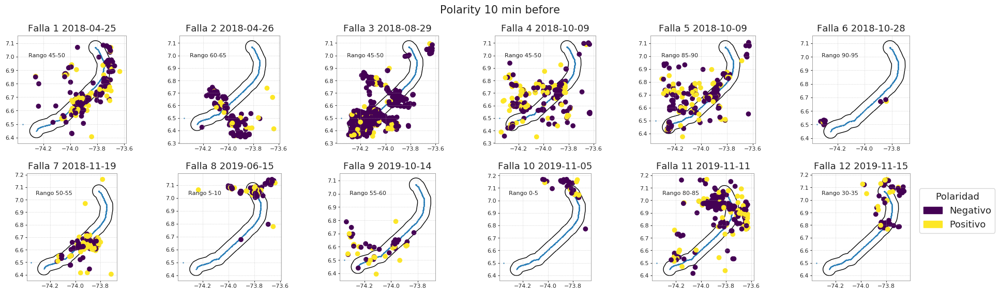

In [34]:
fig = plt.figure(figsize=(20,6))
for i, (lab,row) in enumerate(outages.iterrows()):
  outage_date = row['date']
  ax = plt.subplot(2,6,i+1) 
  towers.plot(ax=ax, markersize=0.5, zorder=-5)
  gdf.plot(facecolor='none',edgecolor='k',ax=ax)
  df = Discharges_before_outage_by_time(outage_date, 10)
  df.plot(ax=ax,column='polarity')
  ax.set_title(f'Falla {i+1} '+outage_date.strftime('%Y-%m-%d'))
  ax.annotate(s='Rango {}-{}'.format(row.r_inf,row.r_sup),xy=(0.1 ,0.8),xycoords='axes fraction', fontsize=8)
  ax.tick_params(labelsize=8)
# fig.subplots_adjust(hspace=-0.05)

# Add a legend for labels
colors = plt.get_cmap('viridis',2)
legend_labels = {colors(0): 'Negativo', colors(1): "Positivo"}

patches = [Patch(color=color, label=label)
           for color, label in legend_labels.items()]
from matplotlib.patches import Patch
ax.legend(handles=patches,
          bbox_to_anchor=(1.05, 0.9),
          facecolor="white", title='Polaridad')
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.suptitle('Polarity 10 min before')

Text(0.5, 0.98, ' Magnitude 10 min before')

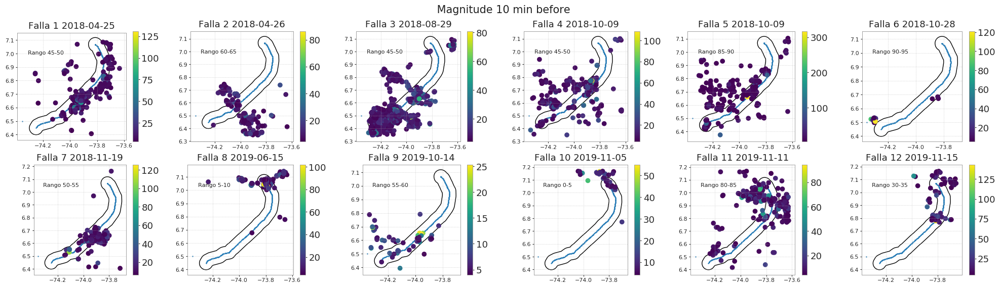

In [35]:
fig = plt.figure(figsize=(20,6))
for i, (lab,row) in enumerate(outages.iterrows()):
  outage_date = row['date']
  ax = plt.subplot(2,6,i+1) 
  towers.plot(ax=ax, markersize=0.5, zorder=-5)
  gdf.plot(facecolor='none',edgecolor='k',ax=ax)
  df = Discharges_before_outage_by_time(outage_date, 10)
  df.plot(ax=ax,column='magnitude', legend=True)
  ax.set_title(f'Falla {i+1} '+outage_date.strftime('%Y-%m-%d'))
  ax.annotate(s='Rango {}-{}'.format(row.r_inf,row.r_sup),xy=(0.1 ,0.8),xycoords='axes fraction', fontsize=8)
  ax.tick_params(labelsize=8)

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.suptitle(' Magnitude 10 min before')

In [36]:
linea = LineString(towers['geometry'])
linea= gpd.GeoDataFrame(geometry=[linea],crs="EPSG:4326")

Now, we want to see how the discharges occurring 5 minutes before each outage are spatially distributed

In [37]:
# Function to create Json features that will be plotted as discharges
def create_geojson_features(df):
    colors = {
    1:'orange',
    2:'red',
    3:'darkred',
    4:'lightgreen',
    5:'green',
    6:'darkgreen',
    7:'lightblue',
    8:'blue',
    9:'darkblue',
    10:'gray',
    11:'cadetblue',
    12:'purple'
    }   
    features = []
    for _, row in df.iterrows():
        feature = {
            'type': 'Feature',
            'geometry': {
                'type':'Point', 
                'coordinates':[row['longitude'],row['latitude']]
            },
            'properties': {
                'time': row['date'].to_pydatetime().__str__(),
                'style': {'color' : colors[row['outage']]},
                'icon': 'circle',
                'iconstyle':{
                    'fillColor': colors[row['outage']],
                    'fillOpacity': 0.8,
                    'stroke': 'true',
                    'radius': 1
                }
            }
        }
        features.append(feature)
    return features

In [38]:
#Loops through each outage and applies the function "Discharges_before_outage_by_time" to extract n-minute last discharges before
for y, outage_date in enumerate(outages['date']):
    discharges_before_outage_by_time = Discharges_before_outage_by_time(outage_date, 10)
    discharges_before_outage_by_time['outage'] = y+1
    exec(f'discharges_before_outage_by_time_{str(y+1)} = discharges_before_outage_by_time') 

In [39]:
# Creates a feature for each outage applying the Json feature function "create_geojson_features"
for i in range(1,13):
    exec(f'features_outage_{str(i)} = create_geojson_features(discharges_before_outage_by_time_{str(i)})')

In [40]:
coords_study = [6.73, -73.98]
#Creates the map
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

# Plots towers
for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #1
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_1}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)

# Plots 5-min-before discharges related to outage #2
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_2}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

In [41]:
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #3 
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_3}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)
# Plots 5-min-before discharges related to outage #4
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_4}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

In [42]:
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #5  
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_5}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)

# Plots 5-min-before discharges related to outage #6
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_6}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

In [43]:
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #7    
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_7}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)

# Plots 5-min-before discharges related to outage #8
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_8}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

In [44]:
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #9    
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_9}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)

# Plots 5-min-before discharges related to outage #10
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_10}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

In [45]:
folium_map = DualMap(location=coords_study, control_scale=True, zoom_start=10, tiles='cartodbpositron')

for i in range(len(towers['latitude'])):
    line = folium.RegularPolygonMarker(location=[towers["latitude"][i], towers["longitude"][i]],
                                 radius=1, popup='tower', color="black", fill_color='black')
    line.add_to(folium_map)

# Plots 5-min-before discharges related to outage #11        
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_11}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m1)

# Plots 5-min-before discharges related to outage #12
TimestampedGeoJson(
    {'type': 'FeatureCollection',
    'features': features_outage_12}
    , period='PT5S'
    , add_last_point=True
    , auto_play=True
    , loop=False
    , max_speed=1
    , loop_button=True
    , date_options='YYYY/MM/DD HH:mm:SS'
    , time_slider_drag_update=True
).add_to(folium_map.m2)

folium_map

# Mockup

Regarding the frontend mockup, we followed ISA INTERCOLOMBIA's request. They expect to have a probability prediction of powerline failure, 5 minutes ahead of it, with a high confidence level. So, the current visualization is composed of the following elements:
* A map display in which ISA INTERCOLOMBIA can see the electrical discharges in the power line's surrounding area where its location, magnitude, and polarity are plotted.
* The number of towers belonging to the line (counter).
* The number of discharges in the last hour (counter). This indicator can be modified according to the model's output about the event.
* The number of powerline outages predicted by the model (counter).
* A tachometer showing the outage probability goes from 0% to 100% with three colors indicating the severity level: green from 0% to 25%; orange from 25% to 75%; and red from 75% to 100%.
* A card with the estimated time of failure.
* The confidence level of the estimate.
* The failure probability level, which shows in a bigger size what is indicated by the tachometer.
These indicators are subject to redesign in the project according to customer's needs and the DS4A training. Based on this, the possibility of creating a historical board making details of the phenomenon visible is under discussion by the team.

<img src="data/dashboard.jpeg" width=900 height=50 align="left" />